## Adding Data Set 


In [ ]:
import os
import numpy as np 
import torch
import torch.utils.data
%matplotlib inline
import matplotlib.pyplot as plt
import torchvision.transforms as T
import cv2
import random
import warnings
from PIL import Image

import torchvision
from torchvision.models.detection.faster_rcnn import FastRCNNPredictor
from torchvision.models.detection.mask_rcnn import MaskRCNNPredictor

torch.cuda.empty_cache()

In [ ]:
from google.colab import drive
drive.mount('/content/drive/')

Mounted at /content/drive/


In [ ]:
if os.path.isdir('candle_segmentation')==False:
    !unzip '/content/drive/MyDrive/candle_segmentation.zip'
else: 
  print("Already created")

Archive:  /content/drive/MyDrive/candle_segmentation.zip
   creating: candle_segmentation/
  inflating: candle_segmentation/annotations.xml  
   creating: candle_segmentation/ImageSets/
  inflating: candle_segmentation/ImageSets/1.jpeg  
  inflating: candle_segmentation/ImageSets/10.jpeg  
  inflating: candle_segmentation/ImageSets/11.jpg  
  inflating: candle_segmentation/ImageSets/12.jpg  
  inflating: candle_segmentation/ImageSets/13.jpg  
  inflating: candle_segmentation/ImageSets/14.jpg  
  inflating: candle_segmentation/ImageSets/15.jpg  
  inflating: candle_segmentation/ImageSets/16.jpeg  
  inflating: candle_segmentation/ImageSets/17.jpeg  
  inflating: candle_segmentation/ImageSets/18.jpeg  
  inflating: candle_segmentation/ImageSets/19.jpg  
  inflating: candle_segmentation/ImageSets/2.jpeg  
  inflating: candle_segmentation/ImageSets/20.jpg  
  inflating: candle_segmentation/ImageSets/21.jpg  
  inflating: candle_segmentation/ImageSets/22.jpg  
  inflating: candle_segmentati

In [ ]:
if os.path.isdir('Background')==False:
    !unzip '/content/drive/MyDrive/Backgrounds.zip'
else: 
  print("Already created")

Archive:  /content/drive/MyDrive/Backgrounds.zip
   creating: Backgrounds/
  inflating: Backgrounds/0.jpg       
  inflating: Backgrounds/1.jpeg      
  inflating: Backgrounds/10.jpg      
  inflating: Backgrounds/11.jpeg     
  inflating: Backgrounds/12          
  inflating: Backgrounds/13.jpg      
  inflating: Backgrounds/14          
  inflating: Backgrounds/15.jpg      
  inflating: Backgrounds/16.jpg      
  inflating: Backgrounds/18.jpg      
  inflating: Backgrounds/19.jpeg     
  inflating: Backgrounds/2.jpg       
  inflating: Backgrounds/20.jpg      
  inflating: Backgrounds/3.jpg       
  inflating: Backgrounds/4.jpg       
  inflating: Backgrounds/5.jpeg      
  inflating: Backgrounds/6.jpeg      
  inflating: Backgrounds/7.jpeg      
  inflating: Backgrounds/8           
  inflating: Backgrounds/9.jpg       


### displaying some images


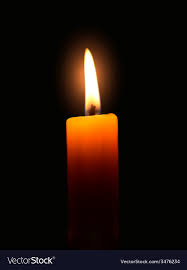

In [ ]:
#displaying the image
Image.open('/content/candle_segmentation/ImageSets/10.jpeg')

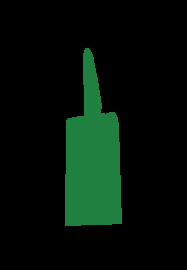

In [ ]:
# displaying the image Class
Image.open('/content/candle_segmentation/SegmentationClass/10.png')

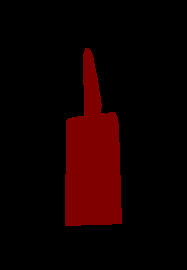

In [ ]:
# displaying the image objects
Image.open('/content/candle_segmentation/SegmentationObject/10.png')

## Adding helper functions from pytourch

In [ ]:
if os.path.isdir('vision')==False:
    !git clone https://github.com/pytorch/vision.git
    %cd vision
    !git checkout v0.8.2
    !cp references/detection/utils.py ../
    !cp references/detection/transforms.py ../
    !cp references/detection/coco_eval.py ../
    !cp references/detection/engine.py ../
    !cp references/detection/coco_utils.py ../
    %cd ../
    cwd = os.getcwd()
    print(cwd)

Cloning into 'vision'...
remote: Enumerating objects: 254639, done.
remote: Counting objects: 100% (7318/7318), done.
remote: Compressing objects: 100% (464/464), done.
remote: Total 254639 (delta 6880), reused 7226 (delta 6839), pack-reused 247321
Receiving objects: 100% (254639/254639), 512.77 MiB | 17.29 MiB/s, done.
Resolving deltas: 100% (231781/231781), done.
/content/vision
Note: checking out 'v0.8.2'.

You are in 'detached HEAD' state. You can look around, make experimental
changes and commit them, and you can discard any commits you make in this
state without impacting any branches by performing another checkout.

If you want to create a new branch to retain commits you create, you may
do so (now or later) by using -b with the checkout command again. Example:

  git checkout -b <new-branch-name>

HEAD is now at 2f40a483d [v0.8.X] .circleci: Add Python 3.9 to CI (#3063)
/content
/content


In [ ]:
def background_aug(img, masks):

  img = np.array(img)

  background = list(sorted(os.listdir(os.path.join('/content/', "Backgrounds"))))
  idx = int(np.random.rand()*len(background))
  background_path = os.path.join('/content/', "Backgrounds", background[idx])
  
  # displaying the image mask created from CVAT format
  background_img = Image.open(background_path)

  background_img = background_img.resize(img[:,:,0].shape)

  candle_position = np.where(masks.T)
  # print("candle positions",candle_position)
  # print("masks shape",masks.shape)
  # print("image shape", img.shape)
  
  background_np_img = np.array(background_img).reshape(img.shape)
  # print("Background shape",background_np_img.shape)
  
  # background_np_img[candle_position] = 0
  # background_np_img[candle_position] = img[candle_position]

  candle = (candle_position[1],candle_position[0])
  # print("candle", candle )
  # background_np_img[candle] = 0
  background_np_img[candle] = img[candle]

  # print(background[candel_position])
  # print(" img candle values", img[candle_position])

  new_image =  Image.fromarray(background_np_img, 'RGB') 
  return new_image







1


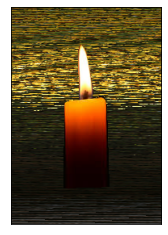

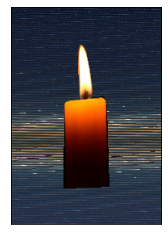

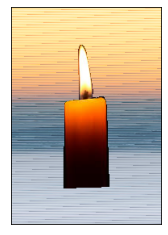

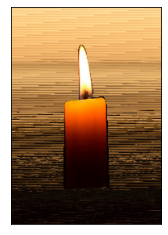

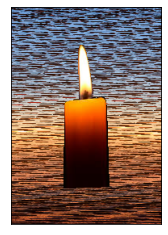

In [ ]:
# Data ugmentation Test Cell 
im = Image.open('/content/candle_segmentation/ImageSets/10.jpeg').convert('RGB')
mask = Image.open('/content/candle_segmentation/SegmentationObject/10.png')


#taking candels from images
new = np.array(mask)
# changing the mask from RGB to a 2-dimension image 
mask = 0.2989 * new[:,:,0] + (0.2989+0.5870 * new[:,:,1]) + (0.2989+0.5870+(0.1140 * new[:,:,2]))
# mask = 0.2989 * new[:,:,0] + (0.5870 * new[:,:,1]) + ((0.1140 * new[:,:,2]))

mask = mask.astype(int)

obj_ids = np.unique(mask)
obj_ids = obj_ids[1:]
print(len(obj_ids))
masks =  obj_ids[:,None,None] == mask
for i in range(5):
  image = background_aug(im , masks)
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])
  plt.show()

In [ ]:
class CandleDataset(torch.utils.data.Dataset):
    def __init__(self, root, transforms=None):
        self.root = root
        self.transforms = transforms
        # load all image files, sorting them to
        # ensure that they are aligned
        self.imgs = list(sorted(os.listdir(os.path.join(root, "ImageSets"))))
        self.masks = list(sorted(os.listdir(os.path.join(root, "SegmentationObject"))))

    def __getitem__(self, idx):
        # load images ad masks
        # print("image number",idx)
        img_path = os.path.join(self.root, "ImageSets", self.imgs[idx])
        mask_path = os.path.join(self.root, "SegmentationObject", self.masks[idx])
        img = Image.open(img_path).convert("RGB")
        # note that we haven't converted the mask to RGB,
        # because each color corresponds to a different instance
        # with 0 being background
        mask = Image.open(mask_path)
        # print("image path", img_path)
        # print("mask path", mask_path)
        new = np.array(mask)
        # changing the mask from RGB to a 2-dimension image 
        # mask = ((new[:,:,0])+(new[:,:,1]*2)+(new[:,:,2]*0.5))/3
        mask = 0.2989 * new[:,:,0] + (0.2989+0.5870 * new[:,:,1]) + (0.2989+0.5870+(0.1140 * new[:,:,2]))
        mask = mask.astype(int)
        # print(" mask Array: ", mask.shape)
        
        # instances are encoded as different colors
        obj_ids = np.unique(mask)
        # print("object id", obj_ids)
        # first id is the background, so remove it
        obj_ids = obj_ids[1:]
        # print("object id after filter", obj_ids)
        # print("object id with None",obj_ids[:,None])

        # split the color-encoded mask into a set
        # of binary masks
        masks = mask == obj_ids[:,None,None ]
        
        if idx<44:
          img = background_aug(img,masks)

        # print("masks shape", masks.shape)
        # print("masks array", masks)
  
        # get bounding box coordinates for each mask
        num_objs = len(obj_ids)
        # print("num of objects", num_objs)
        boxes = []
        for i in range(num_objs):
            # print("object detected", i)
            # print("masks value", masks[i])
            pos = np.where(masks[i])
            xmin = np.min(pos[1])
            xmax = np.max(pos[1])
            ymin = np.min(pos[0])
            ymax = np.max(pos[0])
            boxes.append([xmin, ymin, xmax, ymax])

        boxes = torch.as_tensor(boxes, dtype=torch.float32)
        # there is only one class
        labels = torch.ones((num_objs,), dtype=torch.int64)
        masks = torch.as_tensor(masks, dtype=torch.uint8)

        image_id = torch.tensor([idx])
        area = (boxes[:, 3] - boxes[:, 1]) * (boxes[:, 2] - boxes[:, 0])
        # suppose all instances are not crowd
        iscrowd = torch.zeros((num_objs,), dtype=torch.int64)

        target = {}
        target["boxes"] = boxes # the coordinates of the N bounding boxes in [x0, y0, x1, y1] format, ranging from 0 to W and 0 to H
        target["labels"] = labels # the label for each bounding box
        target["masks"] = masks # The segmentation masks for each one of the objects
        target["image_id"] = image_id # an image identifier. It should be unique between all the images in the dataset, and is used during evaluation
        target["area"] = area # The area of the bounding box. This is used during evaluation with the COCO metric, to separate the metric scores between small, medium and large boxes.
        target["iscrowd"] = iscrowd #  instances with iscrowd=True will be ignored during evaluation.

        if self.transforms is not None:
            img, target = self.transforms(img, target)

        return img, target

    def __len__(self):
        return len(self.imgs)

In [ ]:
# version dependent: pretrained=True or weights='DEFAULT'      
def build_model(num_classes):
    # load an instance segmentation model pre-trained on COCO
    
    model = torchvision.models.detection.maskrcnn_resnet50_fpn(pretrained=True)

    # get the number of input features for the classifier
    in_features = model.roi_heads.box_predictor.cls_score.in_features
    # replace the pre-trained head with a new one
    model.roi_heads.box_predictor = FastRCNNPredictor(in_features, num_classes)

    # Stop here if you are fine-tunning Faster-RCNN

    # now get the number of input features for the mask classifier
    in_features_mask = model.roi_heads.mask_predictor.conv5_mask.in_channels
    hidden_layer = 256
    # and replace the mask predictor with a new one
    model.roi_heads.mask_predictor = MaskRCNNPredictor(in_features_mask,
                                                       hidden_layer,
                                                       num_classes)

    return model

In [ ]:
from engine import train_one_epoch, evaluate
import utils
import transforms as T

def get_transform(train):
    transforms = []
    # converts the image, a PIL image, into a PyTorch Tensor
    transforms.append(T.ToTensor())
    if train:
        # during training, randomly flip the training images
        # and ground-truth for data augmentation
        transforms.append(T.RandomHorizontalFlip(0.5))
    return T.Compose(transforms)

# use our dataset and defined transformations
dataset = CandleDataset('/content/candle_segmentation/', get_transform(train=True))
dataset_test = CandleDataset('/content/candle_segmentation/', get_transform(train=False))

# split the dataset in train and test set
torch.manual_seed(1)
indices = torch.randperm(len(dataset)).tolist()
dataset = torch.utils.data.Subset(dataset, indices[:-10])
dataset_test = torch.utils.data.Subset(dataset_test, indices[-10:])

# define training and validation data loaders
data_loader = torch.utils.data.DataLoader(
    dataset, batch_size=2, shuffle=True, num_workers=0,
    collate_fn=utils.collate_fn)

data_loader_test = torch.utils.data.DataLoader(
    dataset_test, batch_size=1, shuffle=False, num_workers=0,
    collate_fn=utils.collate_fn)

In [ ]:
device = torch.device('cuda:0') if torch.cuda.is_available() else torch.device('cpu')
print(f'device: {device}')

# our dataset has two classes only - background and candle
num_classes = 2

# get the model using our helper function
model = build_model(num_classes)
# move model to the right device
model.to(device)

# construct an optimizer
params = [p for p in model.parameters() if p.requires_grad]
optimizer = torch.optim.SGD(params, lr=0.005,
                            momentum=0.9, weight_decay=0.0005)

# and a learning rate scheduler which decreases the learning rate by
# 10x every 3 epochs
lr_scheduler = torch.optim.lr_scheduler.StepLR(optimizer,
                                               step_size=3,
                                               gamma=0.1)

device: cuda:0


/usr/local/lib/python3.7/dist-packages/torchvision/models/_utils.py:209: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and will be removed in 0.15, please use 'weights' instead.
  f"The parameter '{pretrained_param}' is deprecated since 0.13 and will be removed in 0.15, "
/usr/local/lib/python3.7/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and will be removed in 0.15. The current behavior is equivalent to passing `weights=MaskRCNN_ResNet50_FPN_Weights.COCO_V1`. You can also use `weights=MaskRCNN_ResNet50_FPN_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/maskrcnn_resnet50_fpn_coco-bf2d0c1e.pth" to /root/.cache/torch/hub/checkpoints/maskrcnn_resnet50_fpn_coco-bf2d0c1e.pth


  0%|          | 0.00/170M [00:00<?, ?B/s]

In [ ]:
# number of epochs
num_epochs = 15
# print(data_loader.dataset.target["mask"])
for epoch in range(num_epochs):
    # train for one epoch, printing every 10 iterations
    train_one_epoch(model, optimizer, data_loader, device, epoch, print_freq=1)
    # update the learning rate
    lr_scheduler.step()
    # evaluate on the test dataset
    evaluate(model, data_loader_test, device=device)
    # early stop 
    # data augmentation 
    # change the background values 

Epoch: [0]  [ 0/23]  eta: 0:00:20  lr: 0.000232  loss: 0.3142 (0.3142)  loss_classifier: 0.0617 (0.0617)  loss_box_reg: 0.1089 (0.1089)  loss_mask: 0.1358 (0.1358)  loss_objectness: 0.0011 (0.0011)  loss_rpn_box_reg: 0.0066 (0.0066)  time: 0.9109  data: 0.0801  max mem: 4540
Epoch: [0]  [ 1/23]  eta: 0:00:17  lr: 0.000459  loss: 0.1980 (0.2561)  loss_classifier: 0.0310 (0.0464)  loss_box_reg: 0.0411 (0.0750)  loss_mask: 0.1180 (0.1269)  loss_objectness: 0.0011 (0.0014)  loss_rpn_box_reg: 0.0063 (0.0064)  time: 0.7846  data: 0.0782  max mem: 4540
Epoch: [0]  [ 2/23]  eta: 0:00:20  lr: 0.000686  loss: 0.1980 (0.2137)  loss_classifier: 0.0310 (0.0349)  loss_box_reg: 0.0411 (0.0546)  loss_mask: 0.1180 (0.1160)  loss_objectness: 0.0011 (0.0011)  loss_rpn_box_reg: 0.0066 (0.0072)  time: 0.9588  data: 0.3085  max mem: 4540
Epoch: [0]  [ 3/23]  eta: 0:00:22  lr: 0.000913  loss: 0.1386 (0.1949)  loss_classifier: 0.0202 (0.0312)  loss_box_reg: 0.0231 (0.0467)  loss_mask: 0.0942 (0.1081)  loss_ob

In [ ]:
# set to evaluation mode
model.eval()
CLASS_NAMES = ['__background__', 'Candle']
device = torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu')
model.to(device)

MaskRCNN(
  (transform): GeneralizedRCNNTransform(
      Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
      Resize(min_size=(800,), max_size=1333, mode='bilinear')
  )
  (backbone): BackboneWithFPN(
    (body): IntermediateLayerGetter(
      (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
      (bn1): FrozenBatchNorm2d(64, eps=0.0)
      (relu): ReLU(inplace=True)
      (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
      (layer1): Sequential(
        (0): Bottleneck(
          (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn1): FrozenBatchNorm2d(64, eps=0.0)
          (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (bn2): FrozenBatchNorm2d(64, eps=0.0)
          (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn3): FrozenBatchNorm2d(256, eps=0.0)
          (relu): ReLU(in

In [ ]:
%matplotlib inline
import matplotlib.pyplot as plt
import torchvision.transforms as T
import cv2
import random
import warnings
warnings.filterwarnings('ignore')

def get_coloured_mask(mask):
    """
    random_colour_masks
      parameters:
        - image - predicted masks
      method:
        - the masks of each predicted object is given random colour for visualization
    """
    colours = [[0, 255, 0],[0, 0, 255],[255, 0, 0],[0, 255, 255],[255, 255, 0],[255, 0, 255],[80, 70, 180],[250, 80, 190],[245, 145, 50],[70, 150, 250],[50, 190, 190]]
    r = np.zeros_like(mask).astype(np.uint8)
    g = np.zeros_like(mask).astype(np.uint8)
    b = np.zeros_like(mask).astype(np.uint8)
    r[mask == 1], g[mask == 1], b[mask == 1] = colours[random.randrange(0,10)]
    coloured_mask = np.stack([r, g, b], axis=2)
    return coloured_mask

def get_prediction(img_path, confidence):
    """
    get_prediction
      parameters:
        - img_path - path of the input image
        - confidence - threshold to keep the prediction or not
      method:
        - Image is obtained from the image path
        - the image is converted to image tensor using PyTorch's Transforms
        - image is passed through the model to get the predictions
        - masks, classes and bounding boxes are obtained from the model and soft masks are made binary(0 or 1) on masks
          ie: eg. segment of cat is made 1 and rest of the image is made 0
    
    """
    img = Image.open(img_path)
    transform = T.Compose([T.ToTensor()])
    img = transform(img)

    img = img.to(device)
    pred = model([img])
    pred_score = list(pred[0]['scores'].detach().cpu().numpy())
    pred_t = [pred_score.index(x) for x in pred_score if x>confidence][-1]
    masks = (pred[0]['masks']>0.5).squeeze().detach().cpu().numpy()
    # print(pred[0]['labels'].numpy().max())
    pred_class = [CLASS_NAMES[i] for i in list(pred[0]['labels'].cpu().numpy())]
    pred_boxes = [[(i[0], i[1]), (i[2], i[3])] for i in list(pred[0]['boxes'].detach().cpu().numpy())]
    masks = masks[:pred_t+1]
    pred_boxes = pred_boxes[:pred_t+1]
    pred_class = pred_class[:pred_t+1]
    return masks, pred_boxes, pred_class

def segment_instance(img_path, confidence=0.5, rect_th=2, text_size=1, text_th=2):
    """
    segment_instance
      parameters:
        - img_path - path to input image
        - confidence- confidence to keep the prediction or not
        - rect_th - rect thickness
        - text_size
        - text_th - text thickness
      method:
        - prediction is obtained by get_prediction
        - each mask is given random color
        - each mask is added to the image in the ration 1:0.8 with opencv
        - final output is displayed
    """
    masks, boxes, pred_cls = get_prediction(img_path, confidence)
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    for i in range(len(masks)):
      rgb_mask = get_coloured_mask(masks[i])
      img = cv2.addWeighted(img, 1, rgb_mask, 0.5, 0)
        
      #cv2.rectangle and cv2.putText version dependent
      pt1 = tuple([int(j) for j in boxes[i][0]])
      pt2 = tuple([int(j) for j in boxes[i][1]])  
      cv2.rectangle(img, pt1, pt2,color=(0, 255, 0), thickness=rect_th)
      cv2.putText(img,pred_cls[i], pt1, cv2.FONT_HERSHEY_SIMPLEX, text_size, (0,255,0),thickness=text_th)
    plt.figure(figsize=(20,30))
    plt.imshow(img)
    plt.xticks([])
    plt.yticks([])
    plt.show()

In [ ]:
if os.path.isdir('Test_img')==False:
    !unzip '/content/drive/MyDrive/Test_img.zip'
else: 
  print("Already created")

Already created


In [ ]:
# segment_instance('/content/test2.jpeg', confidence=0.9)

1.jpeg


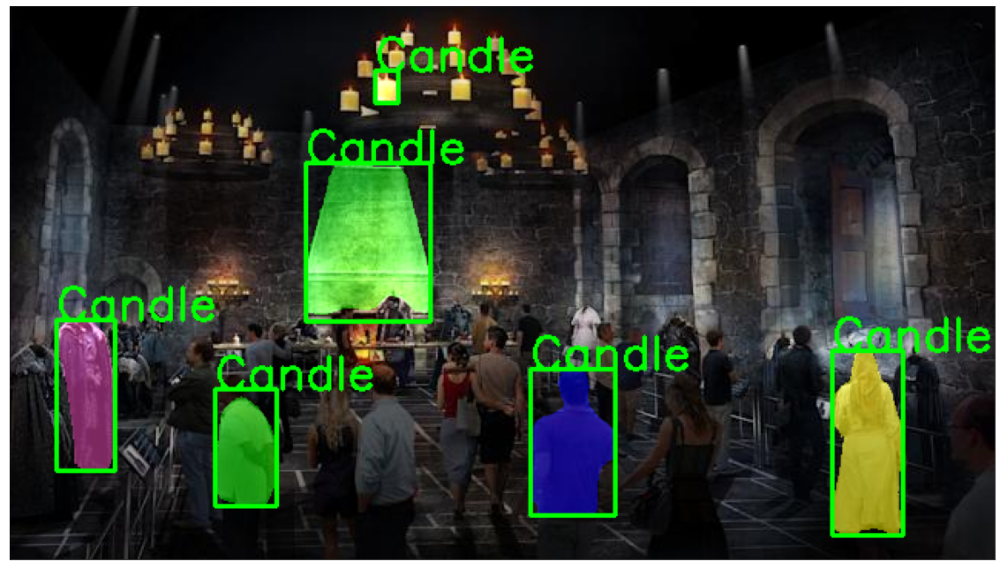

prediction complete
10.jpg
no pridiction found
no pridiction found
no pridiction found
no pridiction found
no pridiction found
no pridiction found


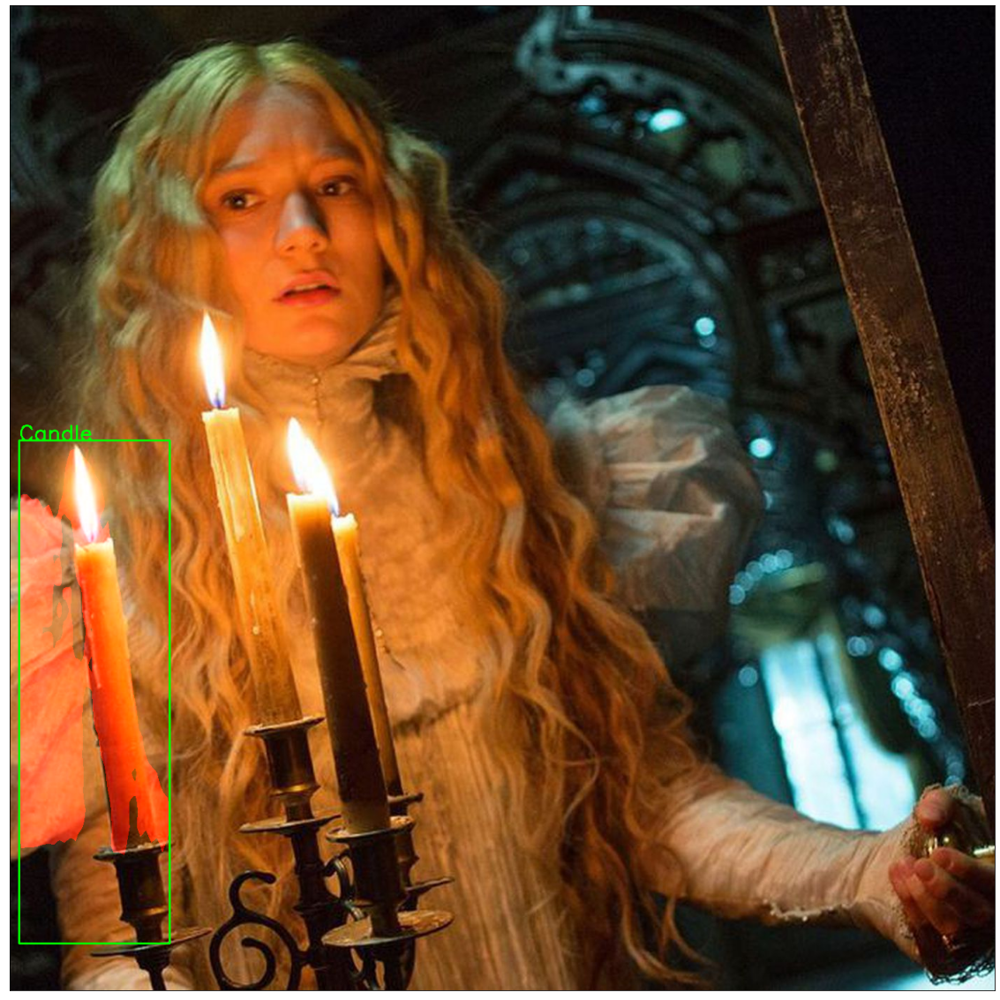

prediction complete
12.jpg


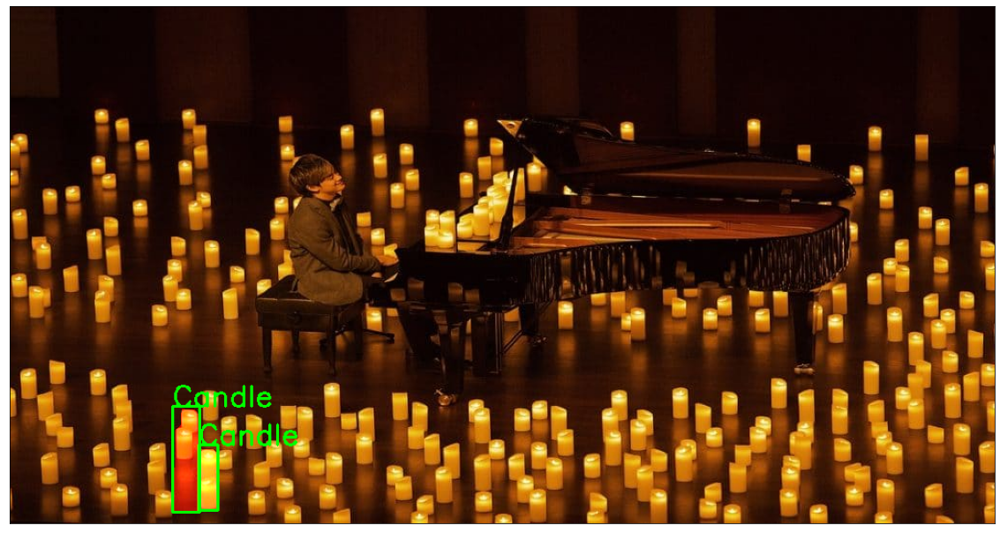

prediction complete
13.jpg


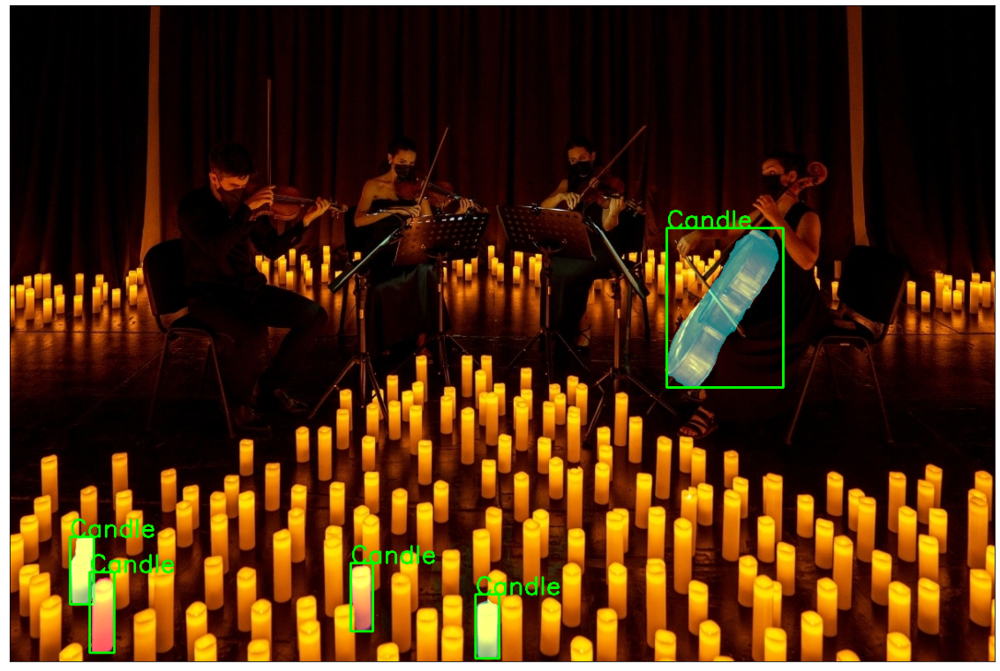

prediction complete
14.jpg


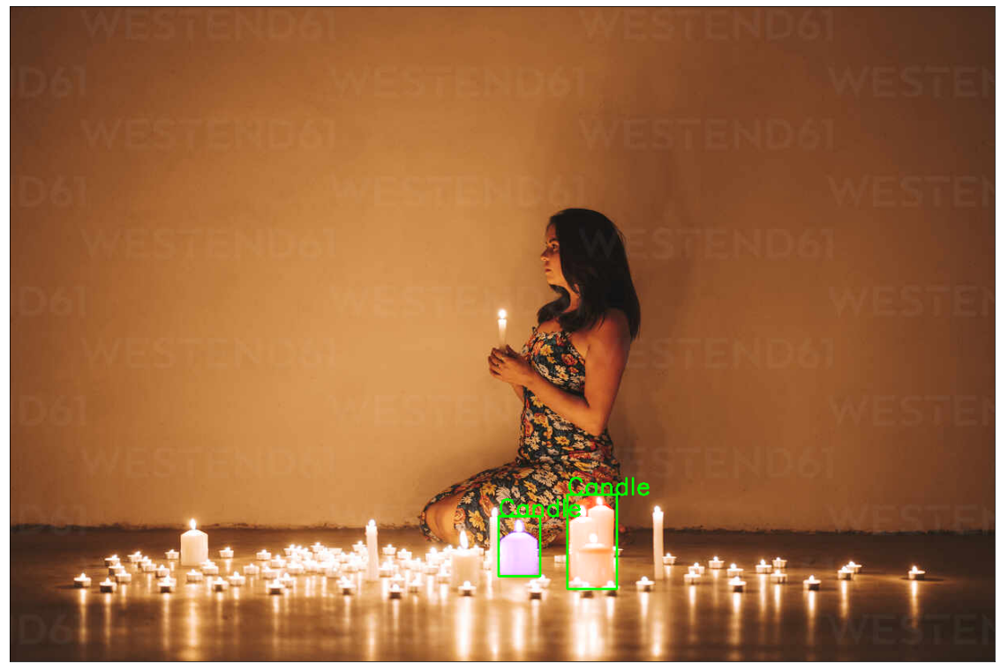

prediction complete
15.jpg


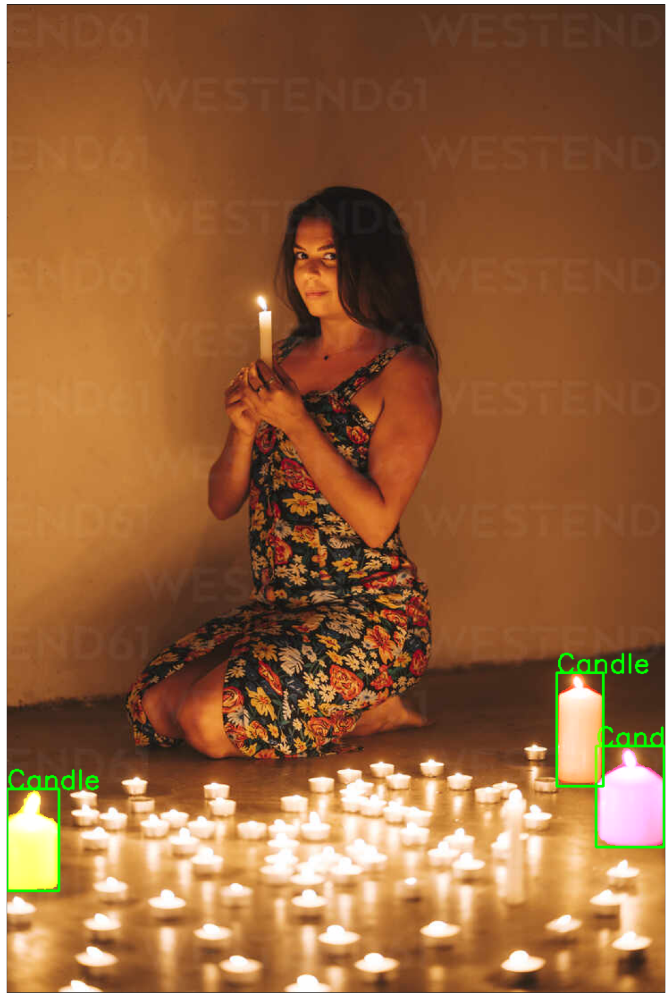

prediction complete
2.jpg


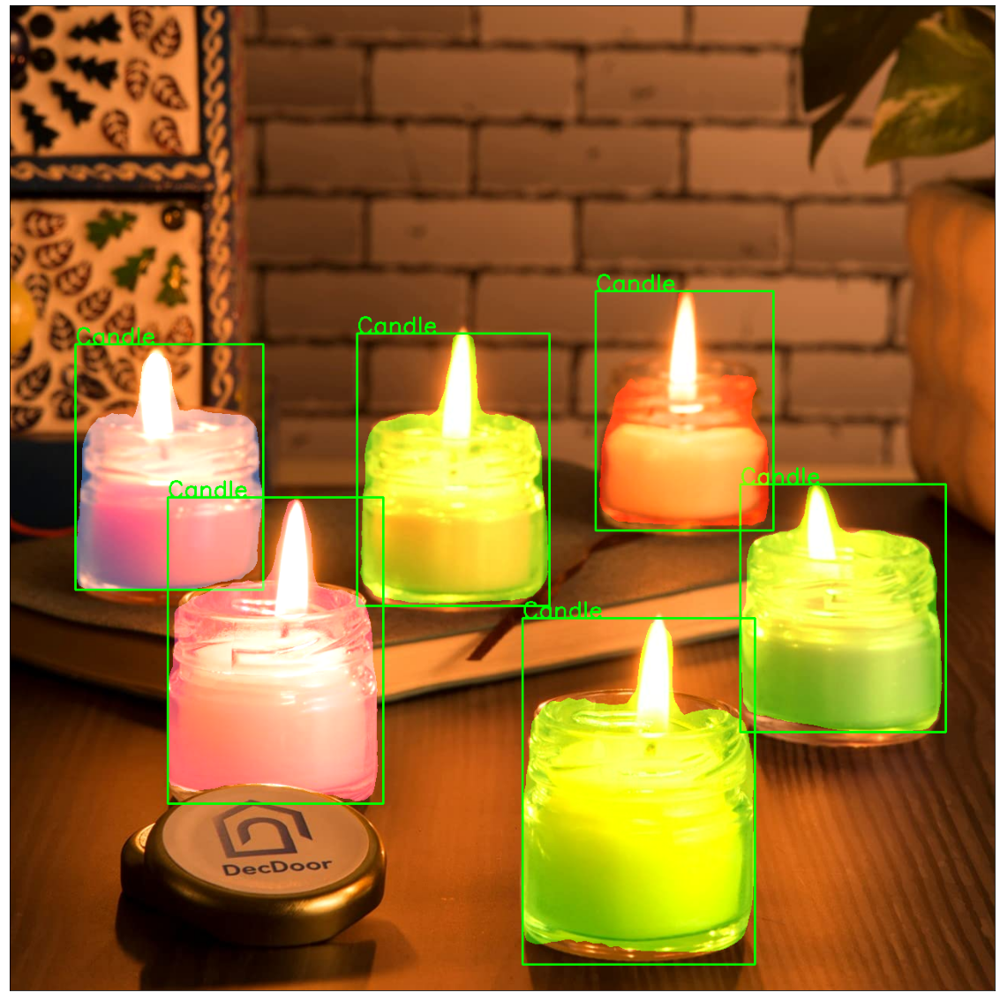

prediction complete
3.jpg


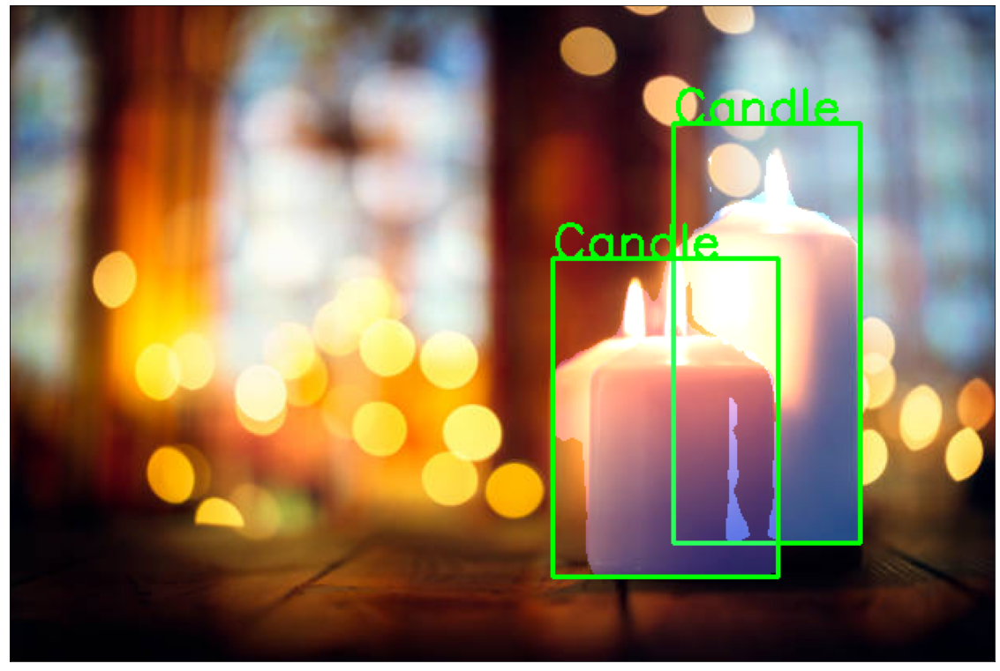

prediction complete
4.jpg


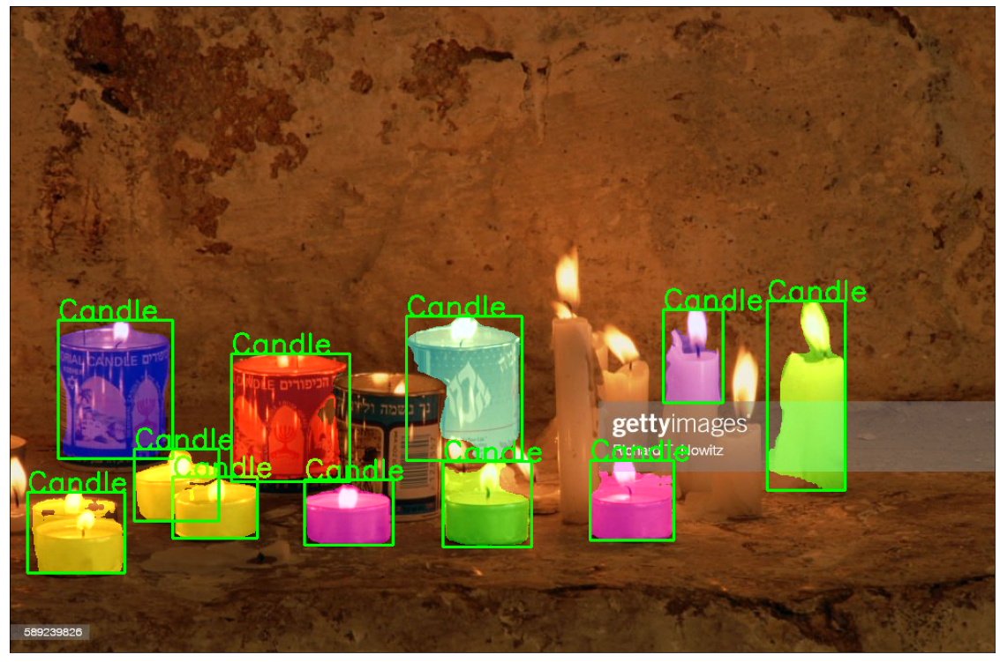

prediction complete
5.jpg


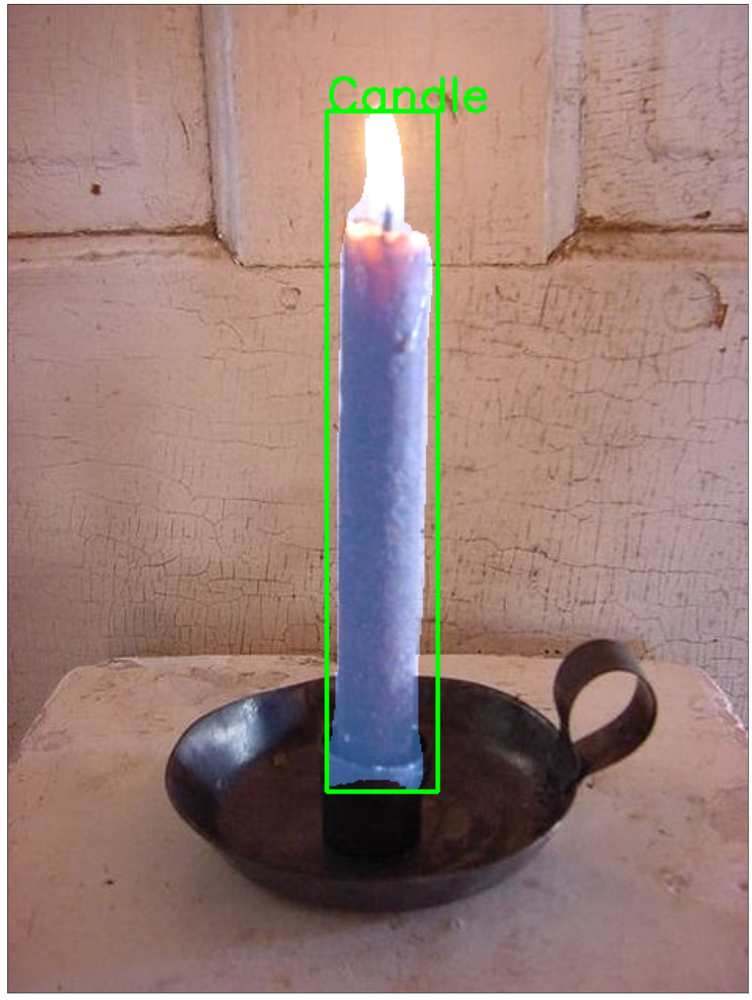

prediction complete
6.jpg


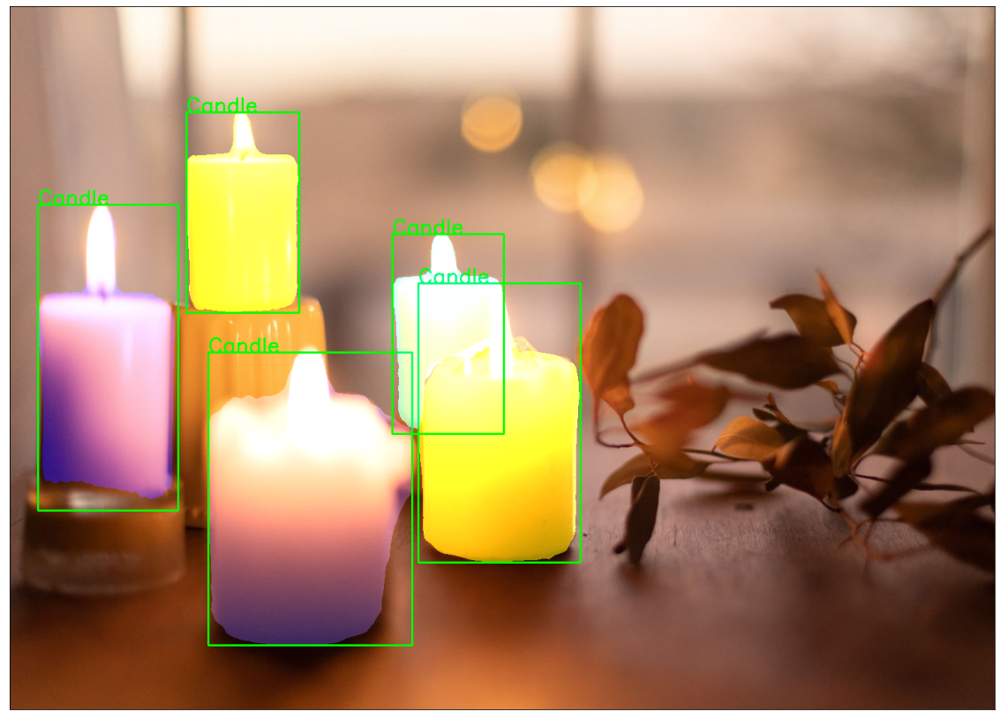

prediction complete
8.jpg


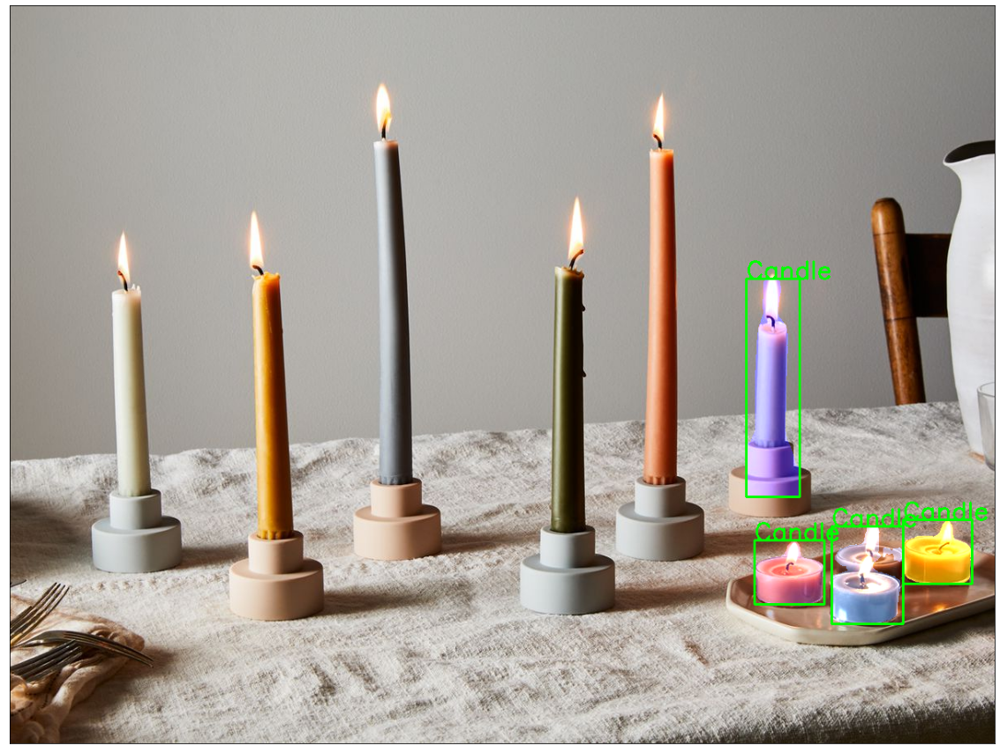

prediction complete
test2.jpeg


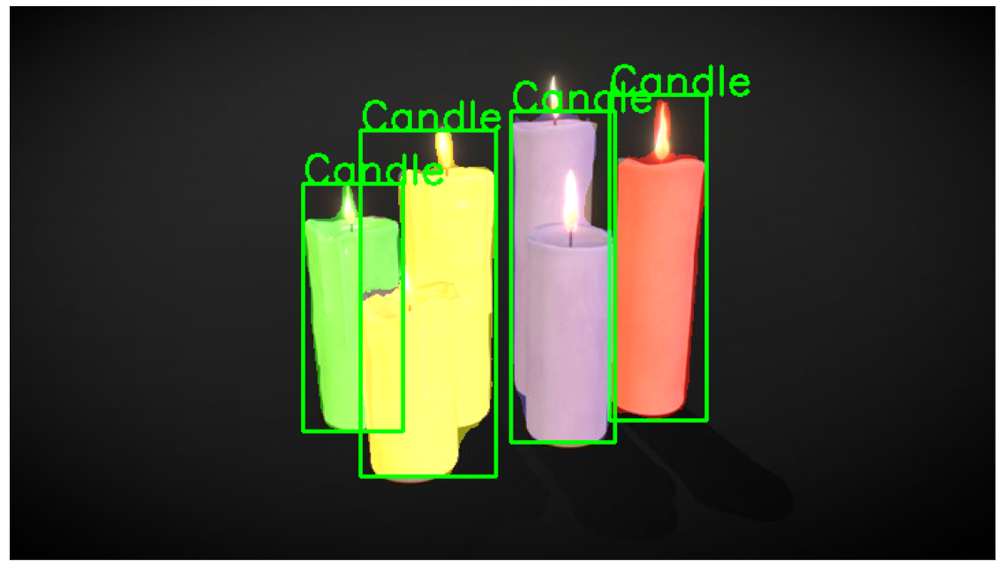

prediction complete


In [ ]:
# segment_instance('/content/Test_img/1.jpeg', confidence=0.9)
list_test_img = list(sorted(os.listdir(os.path.join('/content/', "Test_img"))))
results = []


for  test_img in list_test_img : 
  
  if test_img == ".ipynb_checkpoints": 
    continue 
  print(test_img)
  test_img_path = os.path.join('/content/', "Test_img", test_img)
  condition =False
  confidence = 0.9
  while(condition == False ):
    try: 
        segment_instance(test_img_path, confidence)
    except:
      print("no pridiction found")
      confidence -= 0.05    
    else:
        print("prediction complete")
        condition = True
  
  
  # results.append(predection)


## Discussion 
### prevent Over Fitting 

In order to prevent over fiiting i have applied data augmentation in which the images are masked to new background. The process is done iteratively with each training image. their are 20 backgrounds that the system chooses from randomly, meaning that the model can have same image twice. Still the data is now improved from 40 images(training images) to total of (40 * 20 = 800 ). 

### Model Analysis

For testing the model, I have provided very hard images for the testing, with lots of candles and similar shape objects. Still the model was able to detect lots of the candles, as for some casses when the candles are very small the model is not able to detect any candle. Also when an object have the candle shape with the gray color the model some times confuses it to candle. Some candles type are hard to identify like black color candles or wierd shape candles.  

### improve the Model 

The model could be trained better with more type of images, because when searching for images of candles only obvious images of candles where found. To find other images with candles, it was a selective process through lots of images until I found an image with candles such that the candles are not clear. So it is better to have more images in the training set with unclear candles.

Also the size of the candles matters , as mentioned above the candles need to be different sizes because the modle have difficulty to find small size candles. 